# **Análise de Principais Componentes em imagens orbitais**




"Em síntese, no processamento das imagens por principais componentes, o objetivo 
principal é definir o número de dimensões que estão presentes no conjunto de dados e fixar os 
coeficientes que especificam as posições dos eixos que apontem nas direções das mais altas 
variabilidades dos dados. Portanto, eliminar a alta correlação das imagens tem a vantagem de 
reduzir o volume de dados a ser analisado e de redistribuir a informação espectral entre os 
novos principais componentes." (Meneses & Almeida, 2012, p.158).

In [ ]:
#INSTALANDO BIBLIOTECAS NÃO NATIVAS
!pip install spectral
!pip install rasterio
!pip install seaborn

     |████████████████████████████████| 184kB 19.5MB/s 
  Created wheel for spectral: filename=spectral-0.22.2-cp37-none-any.whl size=212938 sha256=c29c142e93e00f62692bfebc094eb0ebf619b14015ae0fcffc3cfe61daf7d3c4
  Stored in directory: /root/.cache/pip/wheels/fb/00/da/ac778d1ab6e196cb7f56d104d4dfdfc0aad4e2b208275c0726
Successfully built spectral
     |████████████████████████████████| 19.1MB 230kB/s 


In [ ]:
#IMPORTANDO BIBLIOTECAS
import pandas as pd #Tratamento de dados em geral (um excel bastante turbinado!)
import matplotlib.pyplot as plt #Plotagem de gráficos
import numpy as np #Tratamento numérico (manipulação de matrizes no nosso caso)
from spectral import imshow, save_rgb #Módulo exclusivo para plotagem de imagens orbitais 
import rasterio #Tratamento de dados do tipo raster
import seaborn as sns #Plotagem de gráficos mais bonitinhos
import matplotlib.gridspec as grid #Módulo para a criação de uma grade de plotagem
import matplotlib.image as mpimg #Módulo para imagens (leitura, plotagem...)
import matplotlib

In [ ]:
#Configurando o tamanho das imagens na janela de output
matplotlib.rcParams['figure.figsize'] = (20,15)

**Como "montar" o Google Drive?**

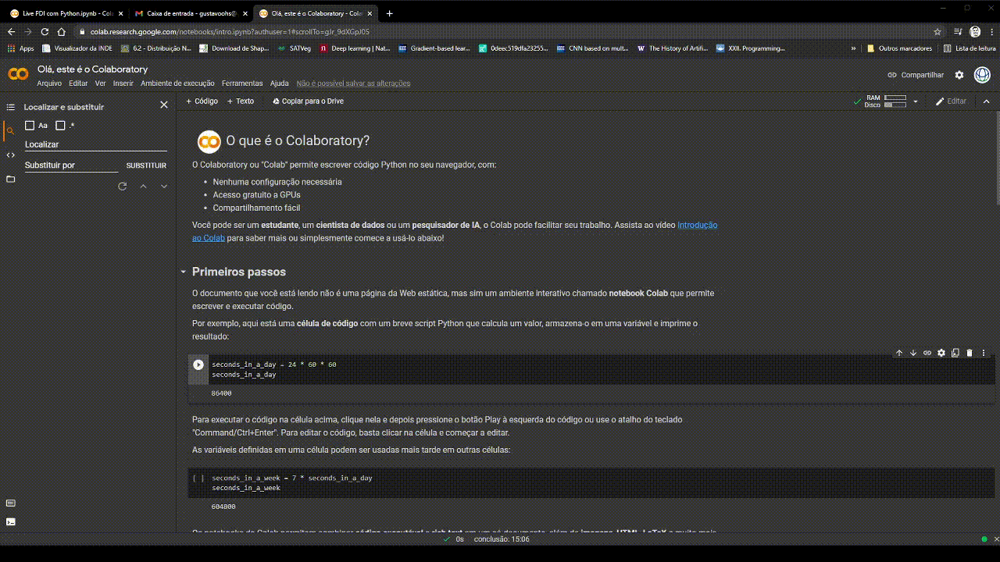

In [ ]:
#LEITURA E PLOTAGEM DAS BANDAS

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#Leitura dos arquivos
b4 = rasterio.open("/content/drive/MyDrive/Live PDI Python/B4.tif")
b5 = rasterio.open("/content/drive/MyDrive/Live PDI Python/B5.tif")
b6 = rasterio.open("/content/drive/MyDrive/Live PDI Python/B6.tif")
b7 = rasterio.open("/content/drive/MyDrive/Live PDI Python/B7.tif")


Bandnames = ['Band 1','Band 2','Band 3','Band 4']

#Transformação dos arquivos em arrays (Matrizes n-dimensionais)
b4 = b4.read(1).astype("float64")
b5 = b5.read(1).astype("float64")
b6 = b6.read(1).astype("float64")
b7 = b7.read(1).astype("float64")

#Armazenando todas as bandas em uma lista
lista_de_bandas1 = [b4,b5,b6,b7]

#Empilhando as bandas
stack = np.dstack(np.array(lista_de_bandas1))

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#Plotando as bandas separadas em um gráfico de uma linha e quatro colunas
f, axarr = plt.subplots(1,4, sharey= True)

axarr[0].imshow(b4, cmap= 'gray')
axarr[0].set_title('B1')
axarr[1].imshow(b5, cmap= 'gray')
axarr[1].set_title('B2')
axarr[2].imshow(b6, cmap= 'gray')
axarr[2].set_title('B3')
axarr[3].imshow(b7, cmap= 'gray')
axarr[3].set_title('B4')

RasterioIOError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

"Os autovalores representam o
comprimento dos eixos das PCs de uma imagem e são medidos em unidades
de variância.
Associados com cada autovalor, existe umoutro conjunto de quantidades,
que é na verdade um conjunto de coordenadas, chamados de autovetores
(eigenvectors), que representam as direções dos eixos das PCs. Os autovetores servem com fatores de ponderação que definem a contribuição de cada
banda original para uma PC." (Crósta, 1999, p.144).

In [ ]:
#Cálculo dos autovetores e autovalores
bandas = 4
Matriz = np.zeros((stack[:,:,0].size,bandas))

#Transformando as imagens em vetores de 1-dimensão
for i in range(bandas):
    vetor = stack[:,:,i].flatten()#função que transforma pata 1-d  
    #vetorstd = (vetor - vetor.mean())/vetor.std()  
    Matriz[:,i] = vetor

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
cov = np.cov(Matriz.transpose())#Calculando a matriz de covariância entre as bandas

autoval,autovec = np.linalg.eig(cov)#Calculando autovetores e autovalores

print("Autovalores:\n\n", autoval,"\n")
print("Autovetores:\n\n", autovec,"\n")

#pd.DataFrame(autovec, columns= ['Banda1', 'Banda2', 'Banda3', 'Banda4'])

Autovalores:

 [44.14911863  8.78623506  1.29976691  1.02844879] 

Autovetores:

 [[ 0.23679446  0.38470363  0.69020884 -0.56528158]
 [ 0.50383759  0.68952491 -0.14887492  0.4985372 ]
 [ 0.74202611 -0.33083981 -0.40982212 -0.41471447]
 [ 0.37346126 -0.51682061  0.57748926  0.50983262]] 



**Cálculo das Principais Componentes**

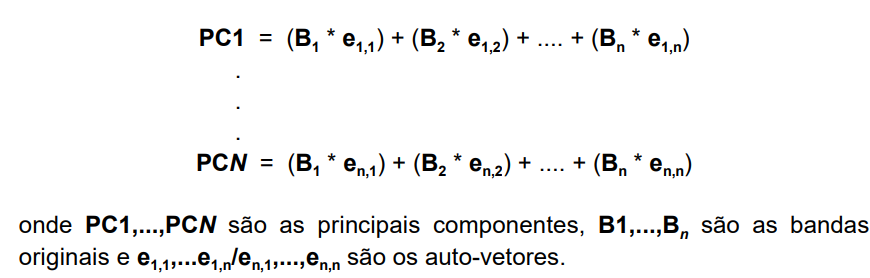

Fonte: (Crósta, 1999, p.144).

In [ ]:
#Ordenando autovetores e autovalores
ord = autoval.argsort()[::-1]#Função que retorna os índices para ordenar um array
autoval = autoval[ord]
autovec = autovec[:,ord]

#Computando as principais componentes 
PC = np.matmul(Matriz,autovec)


**Translação do espaço de atributos**

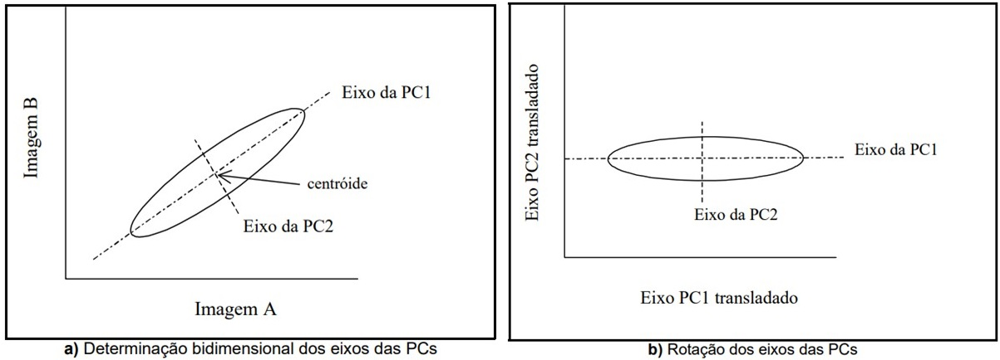

Fonte: Adaptado de Crósta (1999).

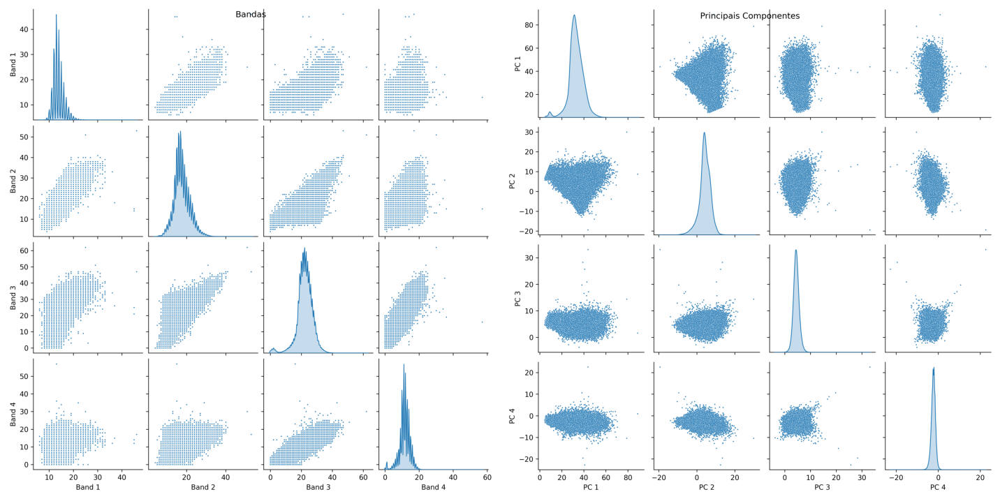

In [ ]:
#Entendendo a translação do espaço de atributos graficamente
#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
bandas_plot = sns.pairplot(pd.DataFrame(Matriz, columns = Bandnames), diag_kind='kde',plot_kws={"s": 3})
bandas_plot.fig.suptitle("Bandas")

PC_nome = ['PC 1','PC 2','PC 3','PC 4']
pc_plot = sns.pairplot(pd.DataFrame(PC, columns = PC_nome), diag_kind='kde',plot_kws={"s": 3})
pc_plot.fig.suptitle("Principais Componentes")
plt.tight_layout()

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#Truque para mostrar os plots lado a lado
bandas_plot.savefig('bandas.png', dpi=300)
plt.close(bandas_plot.fig)

pc_plot.savefig('pc.png', dpi=300)
plt.close(pc_plot.fig)

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
f, axarr = plt.subplots(1, 2, figsize=(20, 20))

axarr[0].imshow(mpimg.imread('bandas.png'))
axarr[1].imshow(mpimg.imread('pc.png'))

[ax.set_axis_off() for ax in axarr.ravel()]

plt.tight_layout()
plt.show()

**Plotando com as retas de regressão (bem mais lento)**

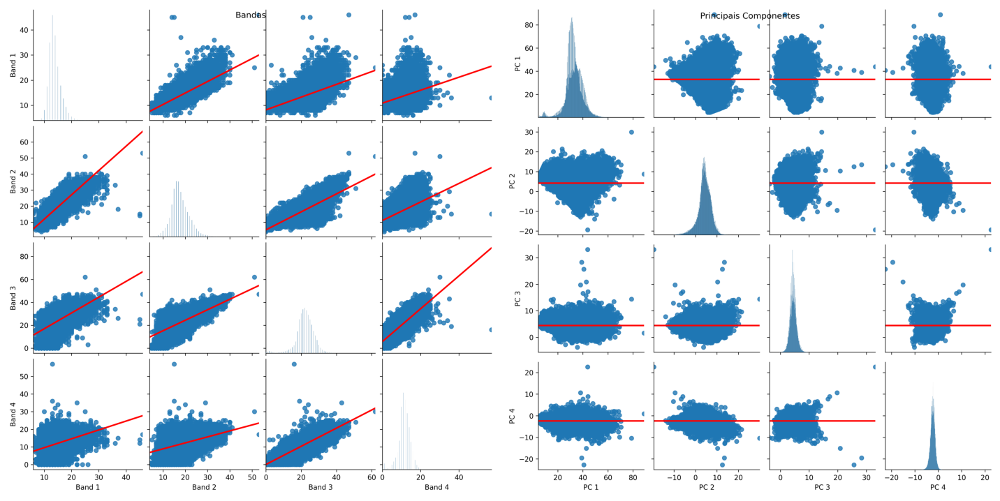

In [ ]:
bandas_plot = sns.pairplot(pd.DataFrame(Matriz, columns = Bandnames), kind='reg' ,plot_kws={'line_kws':{'color':'red'}})
bandas_plot.fig.suptitle("Bandas")

pc_plot = sns.pairplot(pd.DataFrame(PC, columns = PC_nome), kind='reg' ,plot_kws={'line_kws':{'color':'red'}})
pc_plot.fig.suptitle("Principais Componentes")
plt.tight_layout()


bandas_plot.savefig('bandas.png', dpi=300)
plt.close(bandas_plot.fig)

pc_plot.savefig('pc.png', dpi=300)
plt.close(pc_plot.fig)



f, axarr = plt.subplots(1, 2, figsize=(20, 20))

axarr[0].imshow(mpimg.imread('bandas.png'))
axarr[1].imshow(mpimg.imread('pc.png'))


[ax.set_axis_off() for ax in axarr.ravel()]

plt.tight_layout()
plt.show()

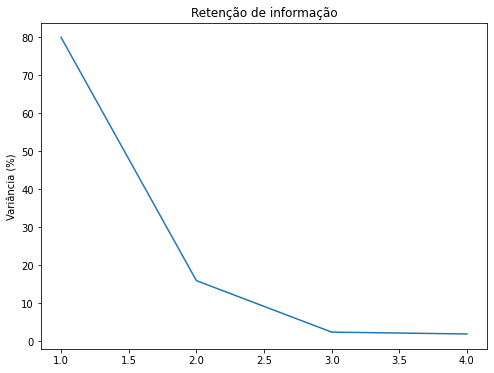

In [ ]:
#Plotando gráfico de retenção da informação em cada PC
plt.figure(figsize=(8,6))
plt.plot([1,2,3,4],autoval/sum(autoval)*100)
plt.ylabel('Variância (%)')
plt.title('Retenção de informação')

In [ ]:
#Recolocando as PCs em 2-dimensões
img_shape = stack.shape
PC_2d = np.zeros((img_shape[0],img_shape[1],bandas))
for i in range(bandas):
    PC_2d[:,:,i] = PC[:,i].reshape(-1,img_shape[1])

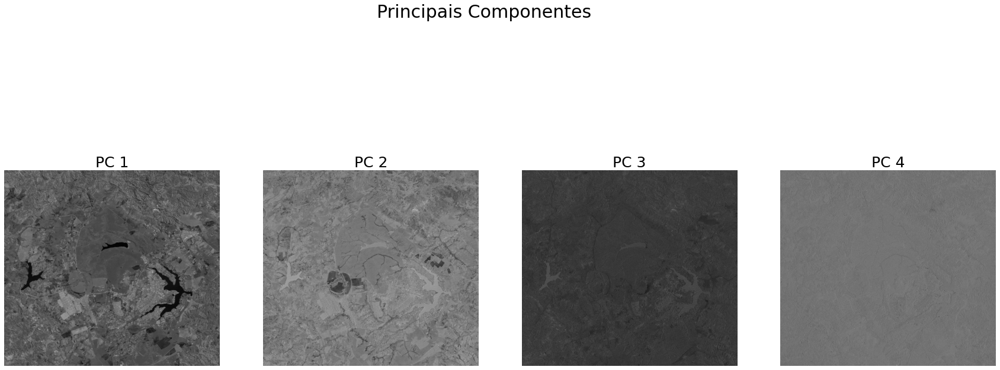

In [ ]:
#Plotando as PCs separadamente
fig,axes = plt.subplots(1,4,figsize=(30,13),sharex='all', sharey='all')
fig.suptitle('Principais Componentes', fontsize=30)

#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
axes = axes.ravel()
for i in range(bandas):
    axes[i].imshow(PC_2d[:,:,i],cmap='gray')
    axes[i].set_title('PC '+str(i+1),fontsize=25)
    axes[i].axis('off')

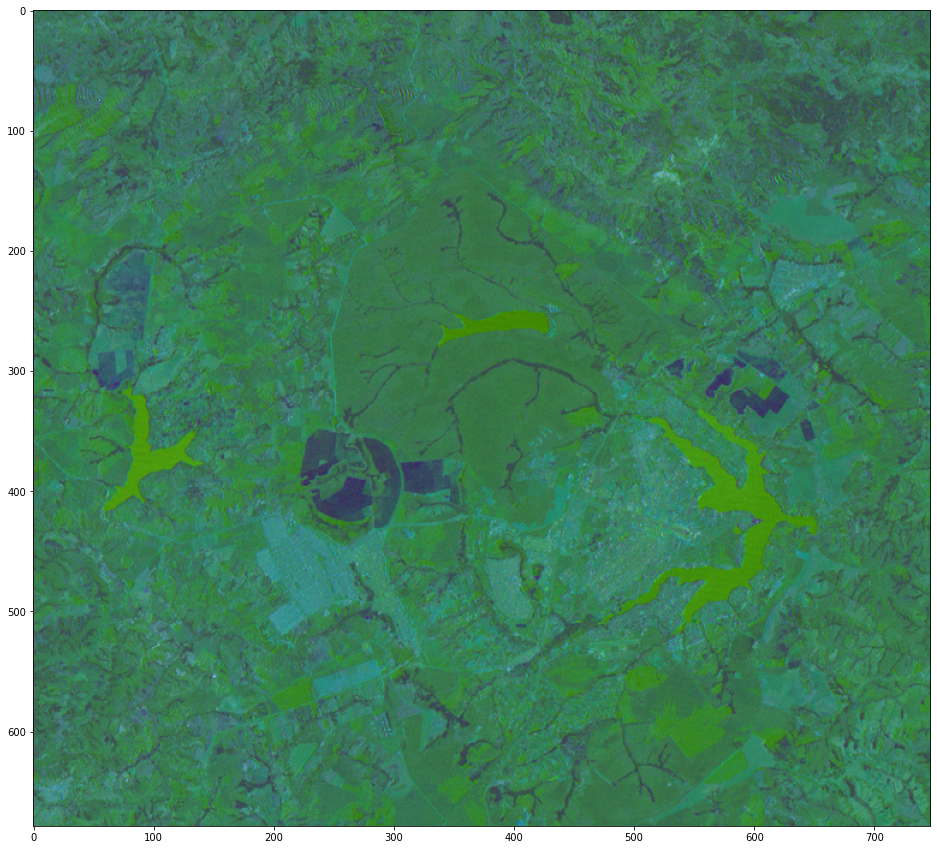

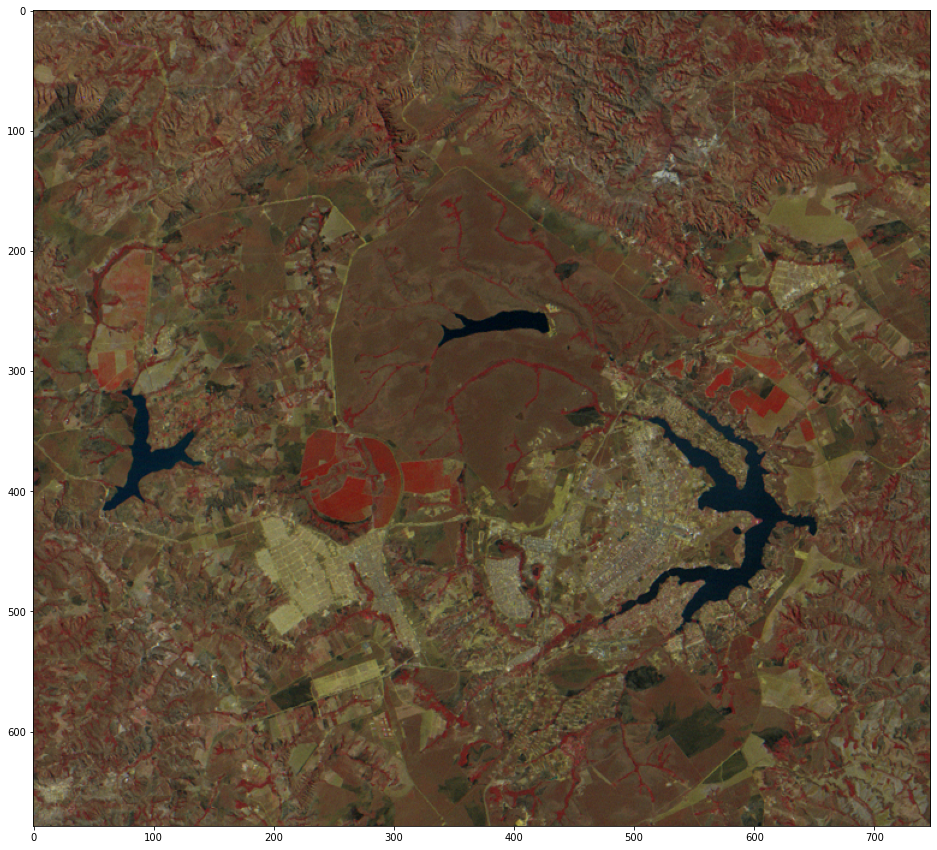

In [ ]:
#Plotando as PCs em RGB
PCs = imshow(PC_2d, bands=(2,1,0))
save_rgb('pcs.jpeg', PC_2d, bands=(2,1,0))
bandas = imshow(stack, bands=(2,1,0))

**Referências**


*   CROSTA, Alvaro Penteado. Processamento digital de imagens de sensoriamento remoto. UNICAMP/Instituto de Geociências, 1999.

*   MENESES, Paulo Roberto; ALMEIDA, Tati. de. Introdução ao processamento de imagens de sensoriamento remoto. Universidade de Brasília, Brasília, 2012.

# **Obrigado!**

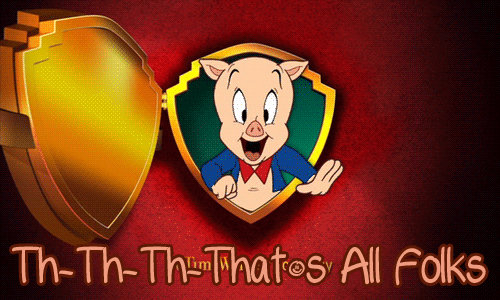